In [50]:
import random
%reload_ext autoreload

from evoscape.landscapes import Landscape
from evoscape.modules import Node, UnstableNode, Center, NegCenter
from evoscape.landscape_visuals import *
from evoscape.morphogen_regimes import mr_const, mr_sigmoid, mr_piecewise
from copy import deepcopy
from matplotlib.cm import viridis
from matplotlib.colors import to_hex


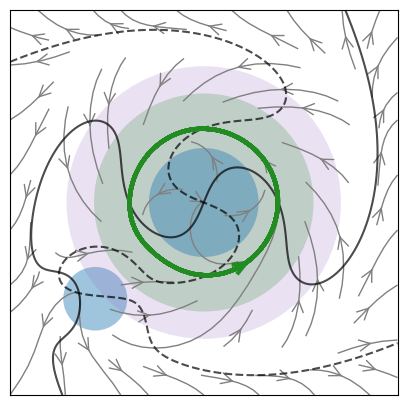

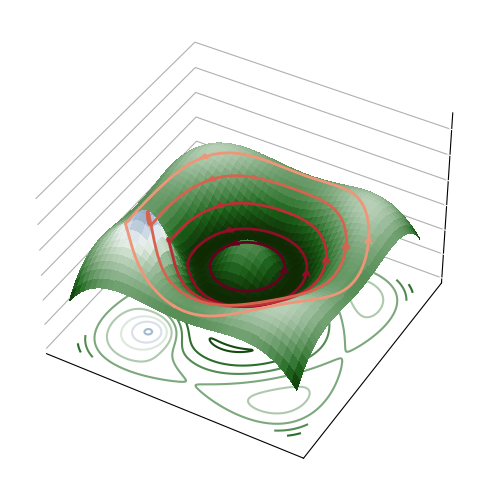

In [8]:
# Inverted landscape (integrate the unstable cycle)
%autoreload

factor = 1.
    
L = 5.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

M1 = UnstableNode(-2.8, -2.5, 3., 0.7)
M2 = Node(0., 0., 1., 1.6*1.5)
M3 = Center(0., 0., 0.6, 3.)
M4 = UnstableNode(0., 0., 2.5, 1.2*factor)

module_lists = ( [M1, M2, M3], [M4, M3], [M1, M2, M3, M4])
module_lists = ( [M1, M2, M3, M4],)

for module_list in module_lists:
    l = Landscape(module_list, A0 = -0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
    # print(l)
    

    fig = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 140., 351), traj_init_cond=(-2.5,-1.1), traj_start=10)
    fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=-1)
    l.init_cells(1, (-2.5, -1.1))
    unstable_traj, states = l.run_cells(0., 70., 351)
    
    
    

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/

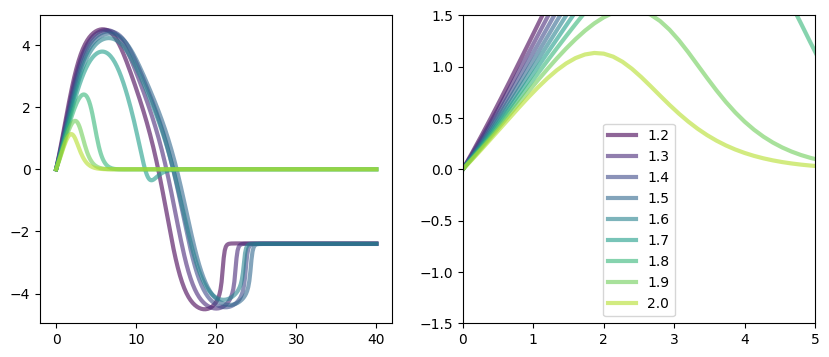

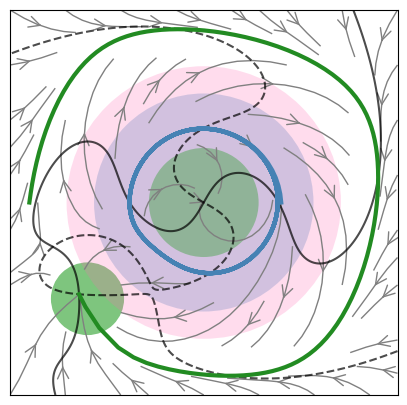

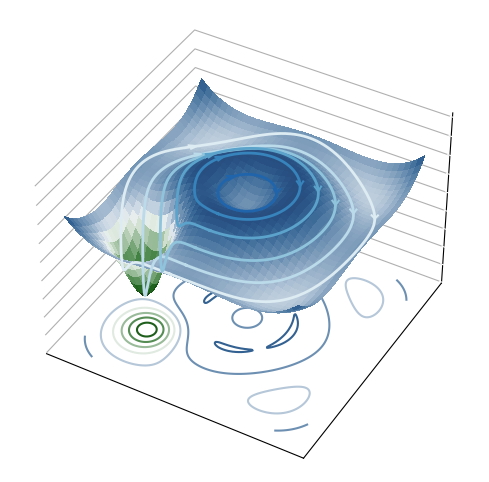

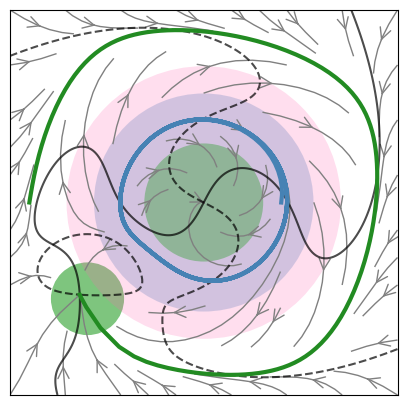

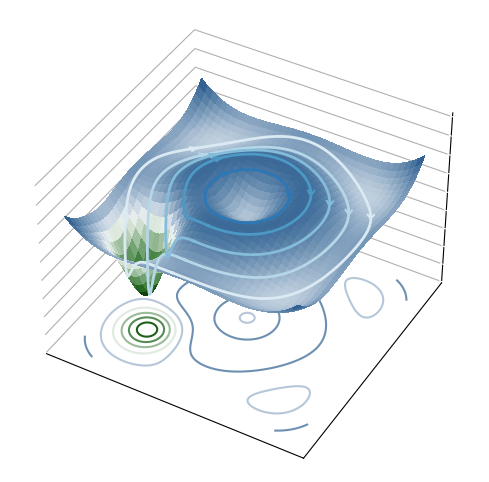

...

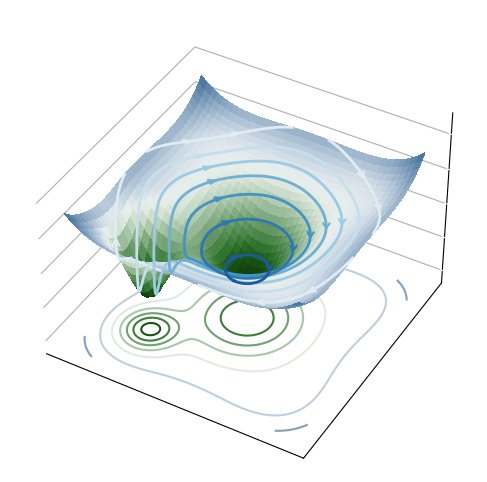

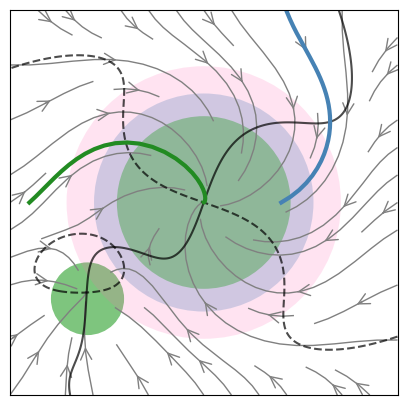

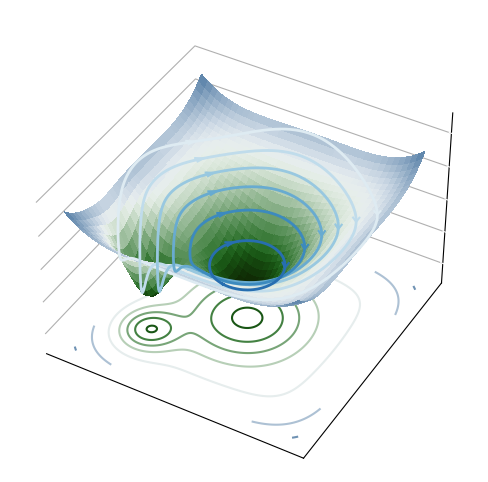

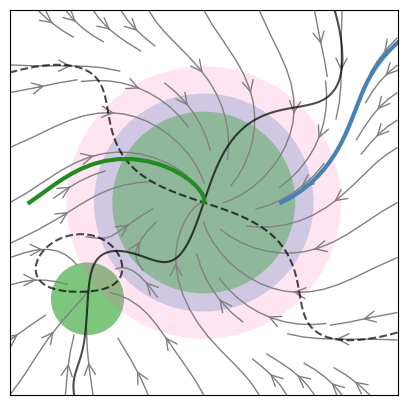

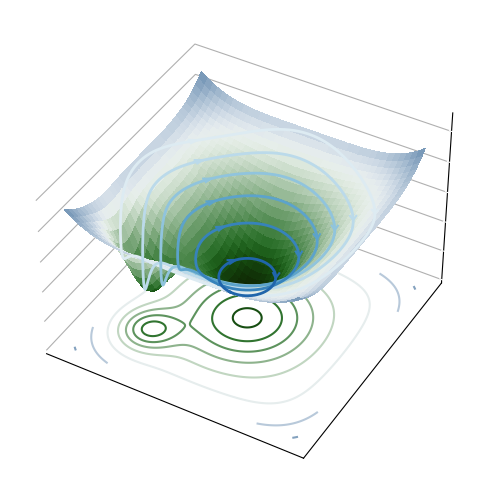

In [94]:
# Normal landscape 

L = 5.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

# for factor in np.linspace(1.2, 2, 9):
for factor in np.linspace(1.2, 2., 9):
    
    # print(factor)
    M1 = Node(-3., -2.5, 6., 0.8)
    M2 = UnstableNode(0., 0., 1., 1.6*1.5, tau=1.)
    M3 = NegCenter(0., 0., 1./factor, 3., tau=1.)
    M4 = Node(0., 0., 2.5, factor, tau=1)
    
    module_lists = ( [M1, M2, M3], [M4, M3], [M1, M2, M3, M4])
    module_lists = ( [M1, M2, M3, M4],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)

        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:97: RuntimeWarning: overflow encountered in square
  r = np.sqrt(xr ** 2 + yr ** 2)
/Users/victoria/Code/

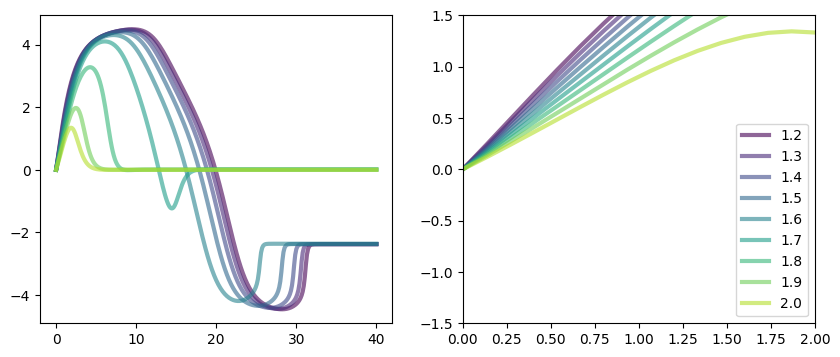

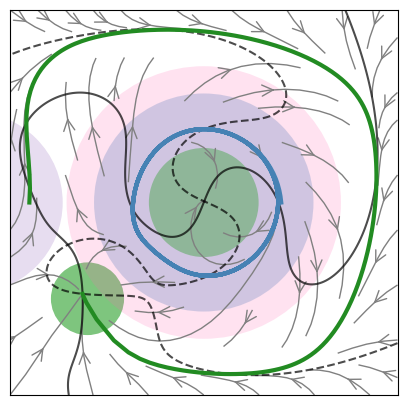

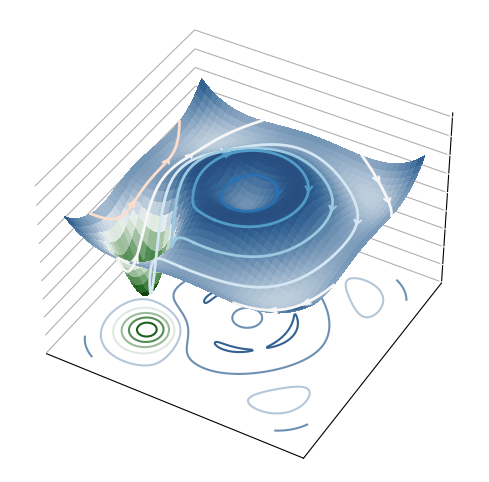

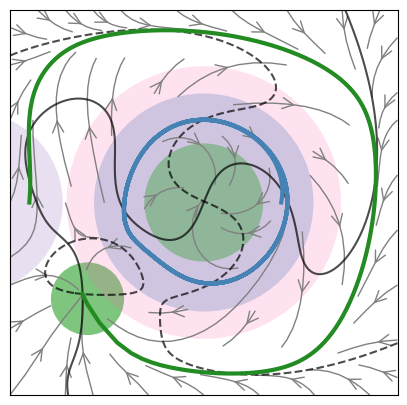

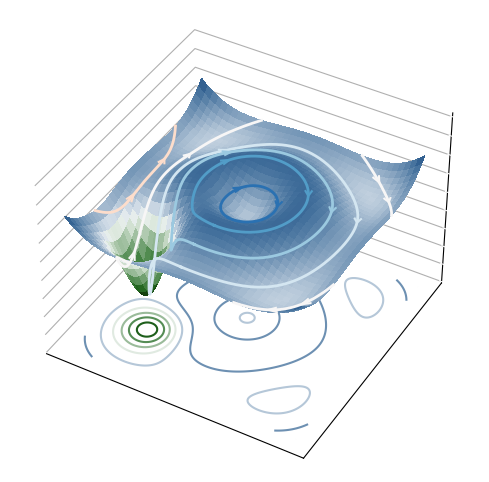

...

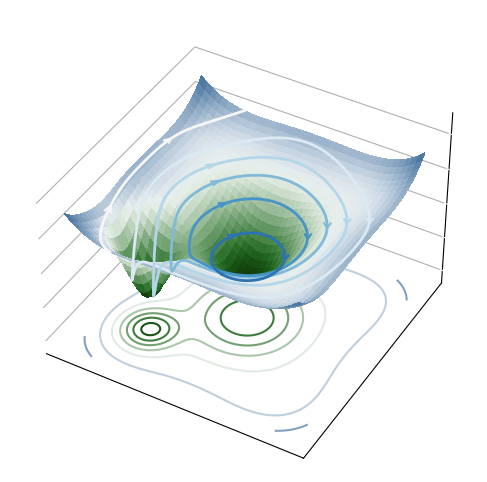

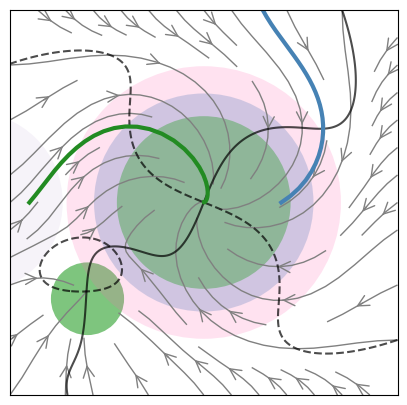

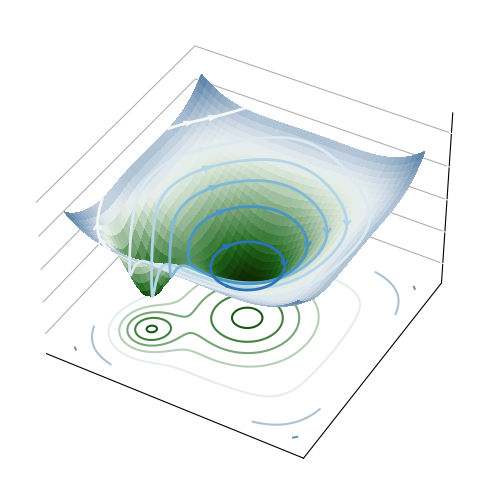

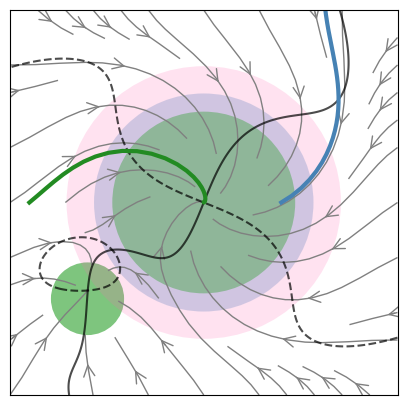

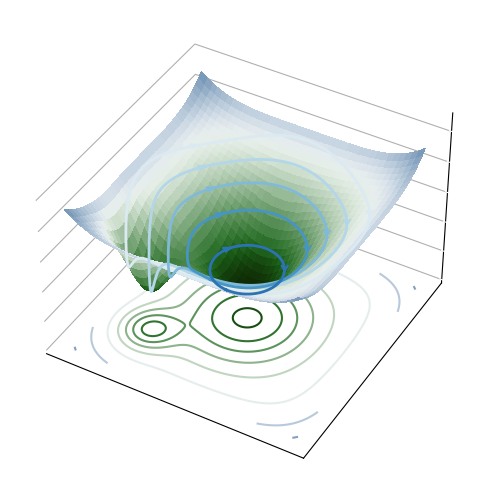

In [96]:
#  Trying to add other modules 

# Normal landscape 

L = 5.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)


# for factor in np.linspace(1.2, 2, 9):
for factor in np.linspace(1.2, 2., 9):
    
    # print(factor)
    M1 = Node(-3., -2.5, 6., 0.8)
    M2 = UnstableNode(0., 0., 1., 1.6*1.5, tau=1.)
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)
    M4 = Node(0., 0., 2.5, factor, tau=1)
    M5 = Center(-6., 0., 2.-factor, 2., tau=1)
    

    module_lists = ( [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)

        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.)
        ax1[1].set_xlim((0, 2))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/

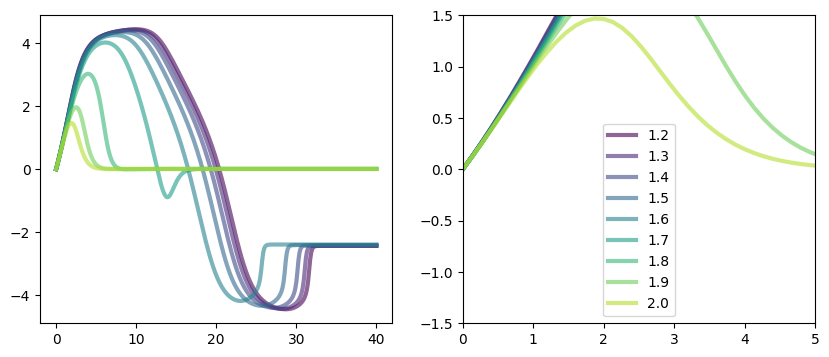

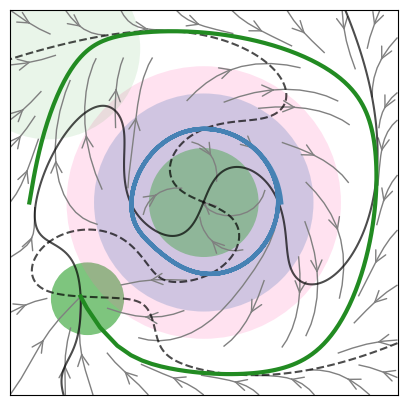

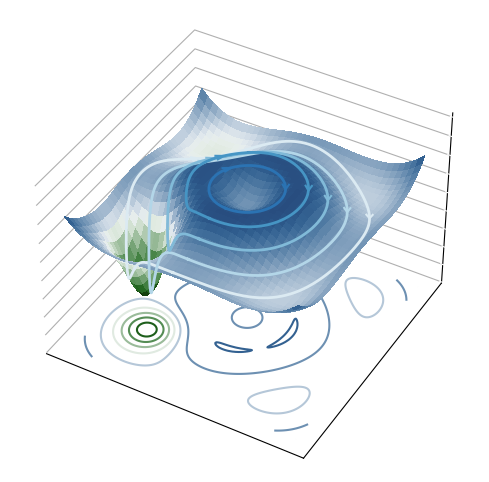

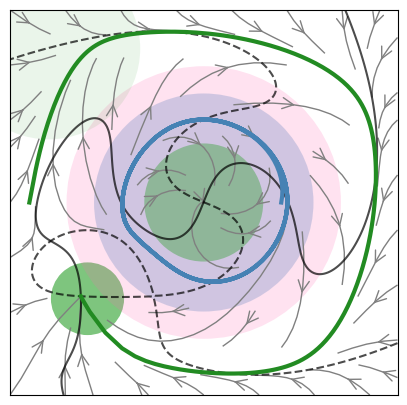

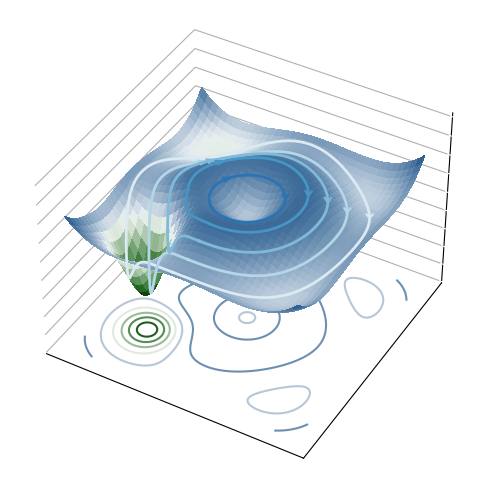

...

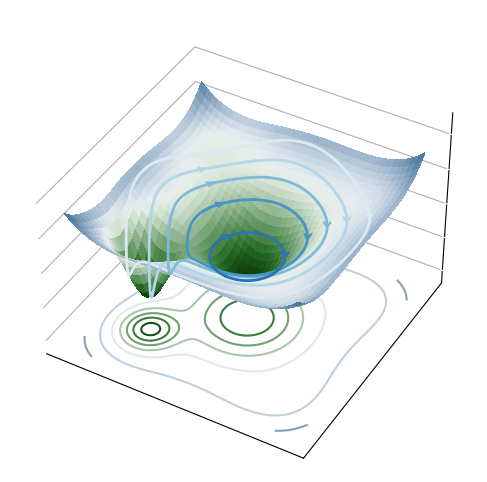

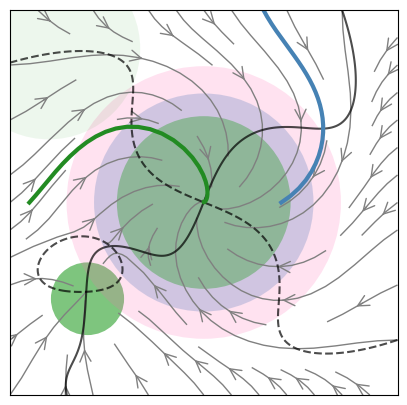

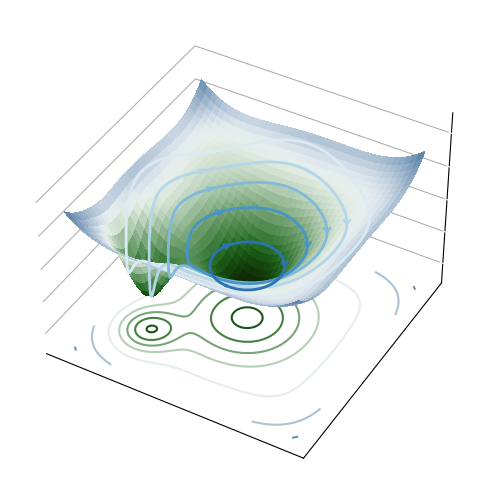

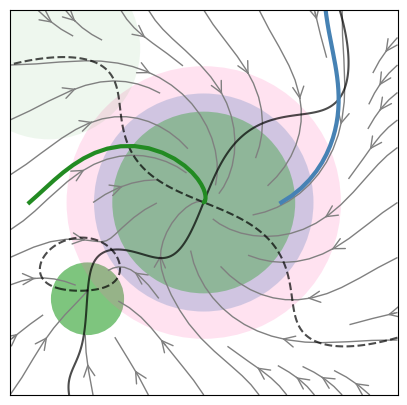

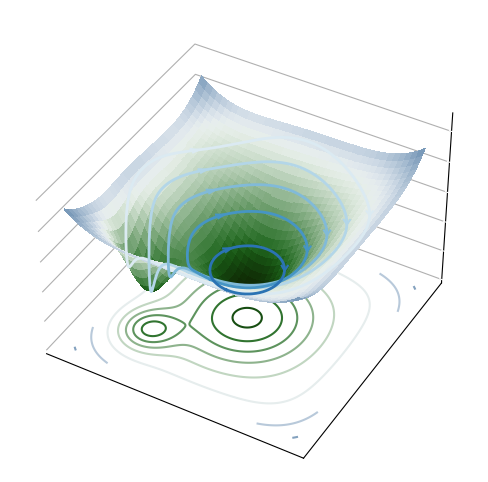

In [93]:
#  Trying to add other modules 

# Normal landscape 

L = 5.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

# for factor in np.linspace(1.2, 2, 9):
for factor in np.linspace(1.2, 2., 9):
    
    # print(factor)
    M1 = Node(-3., -2.5, 6., 0.8)
    M2 = UnstableNode(0., 0., 1., 1.6*1.5, tau=1.)
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)
    M4 = Node(0., 0., 2.5, factor, tau=1)
    M5 = Node(-4., 4., 0.2/factor, 2., tau=1)
    

    module_lists = ( [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
    
        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: overflow encountered in power
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy, axis=0))
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:68: RuntimeWarning: invalid value encountered in multiply
  dy = J[1][0] * x + J[1][1] * y
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:67: RuntimeWarning: invalid value encountered in multiply
  dx = J[0][0] * x + J[0][1] * y
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: invalid value encountered in multiply
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy, axis=0))
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(d

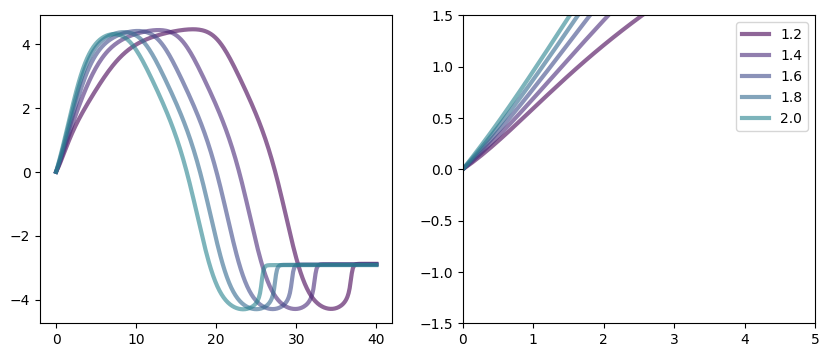

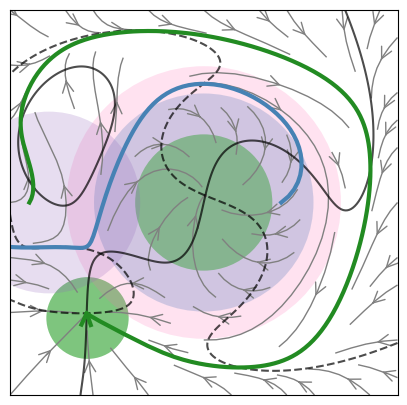

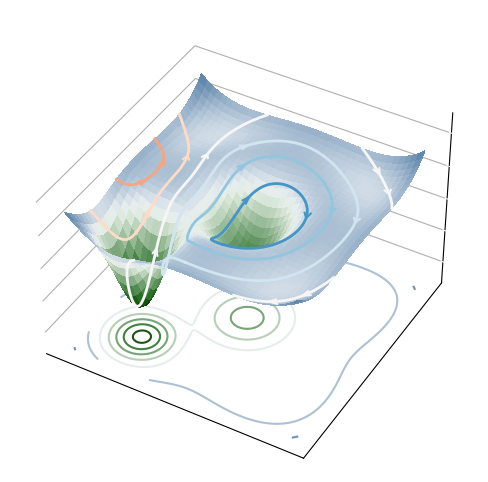

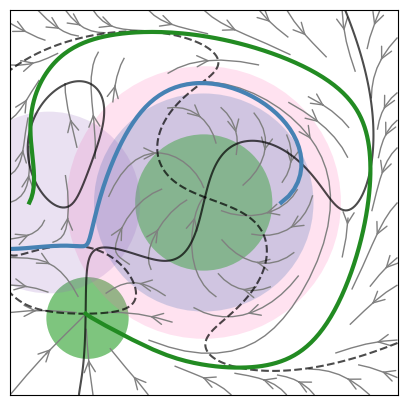

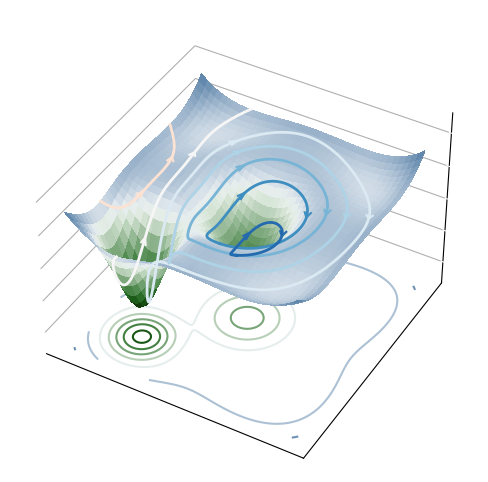

...

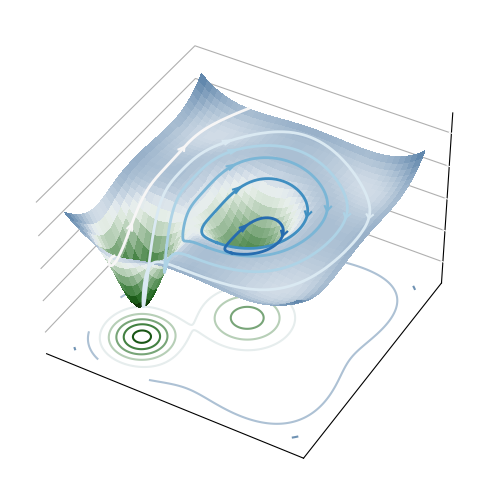

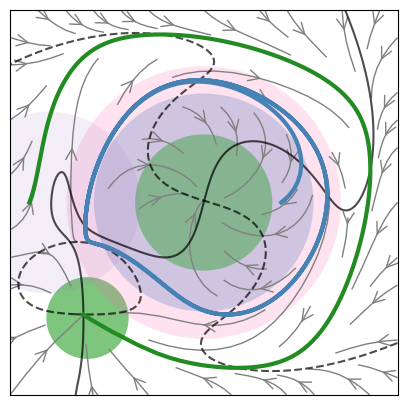

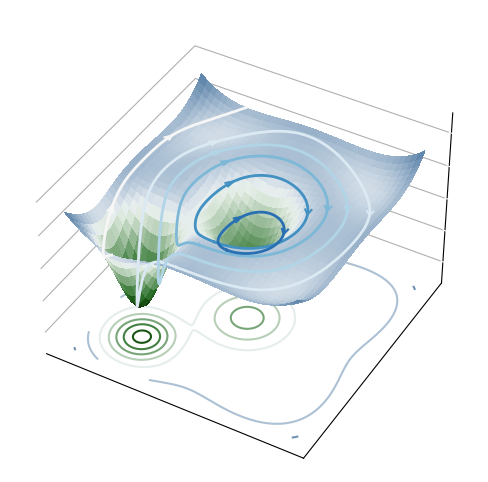

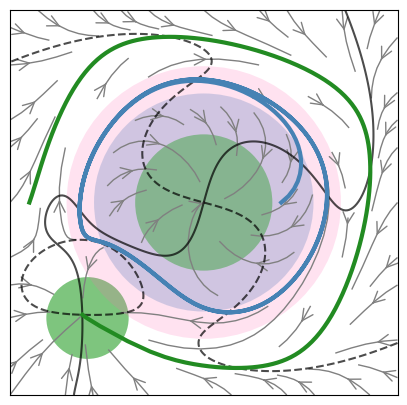

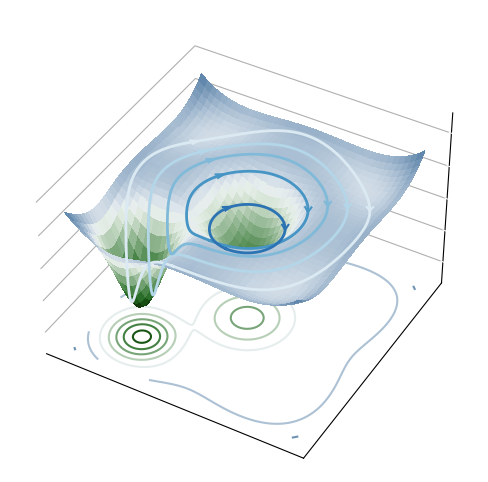

In [111]:
#  Trying to add other modules 

# Normal landscape 

L = 5.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

# for factor in np.linspace(1.2, 2, 9):
for factor in np.linspace(1.2, 2., 5):
    
    # print(factor)
    M1 = Node(-3., -3., 6., 0.9)
    M2 = UnstableNode(0., 0., 1., 1.6*1.5, tau=1.)
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)
    M4 = Node(0., 0., 3.2, 1.5, tau=1)
    M5 = Center(-4., 0., 2.-factor, 2., tau=1)
    

    module_lists = ( [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
    
        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: overflow encountered in power
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy, axis=0))
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:68: RuntimeWarning: invalid value encountered in multiply
  dy = J[1][0] * x + J[1][1] * y
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: invalid value encountered in multiply
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy, axis=0))
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(dir

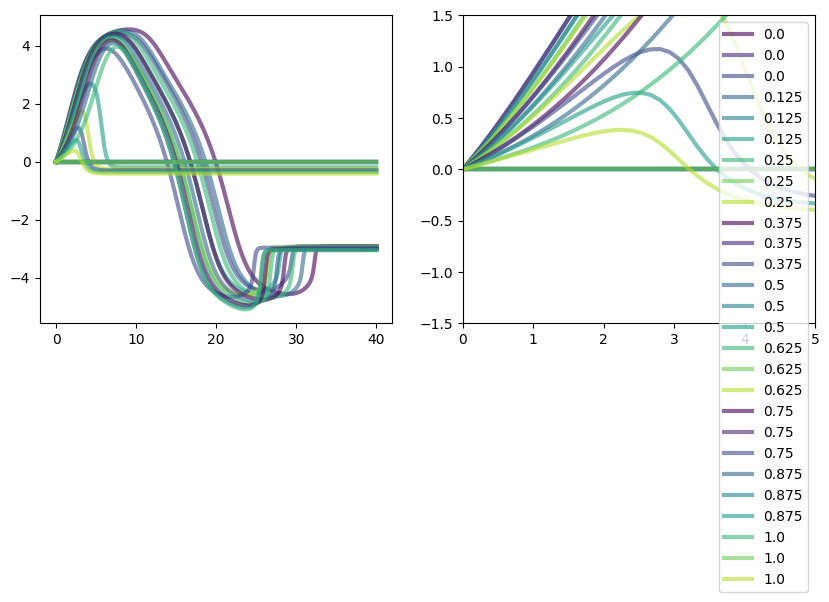

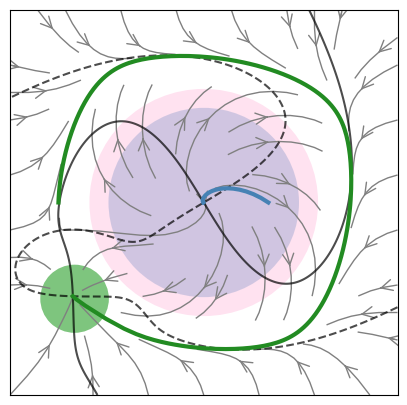

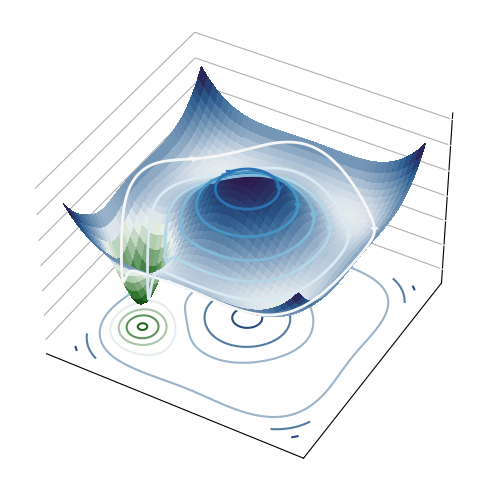

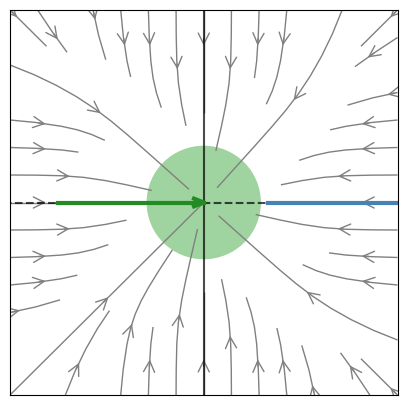

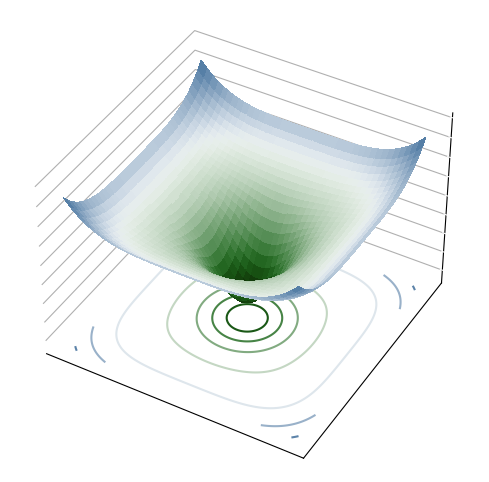

...

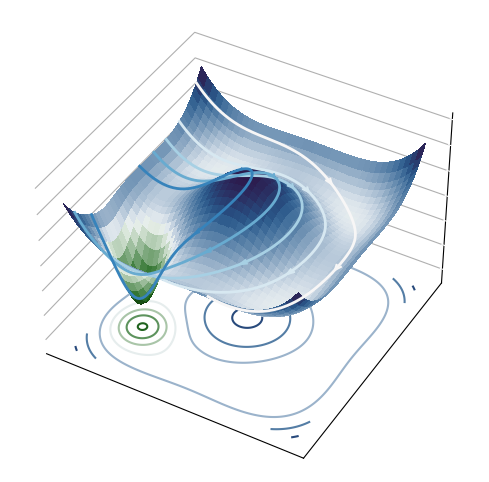

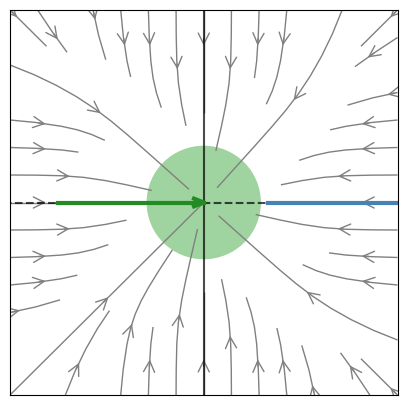

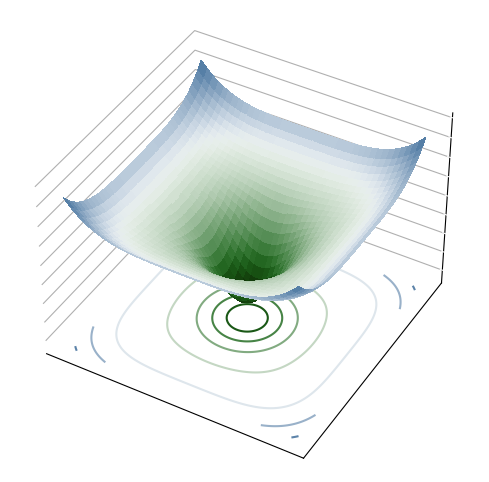

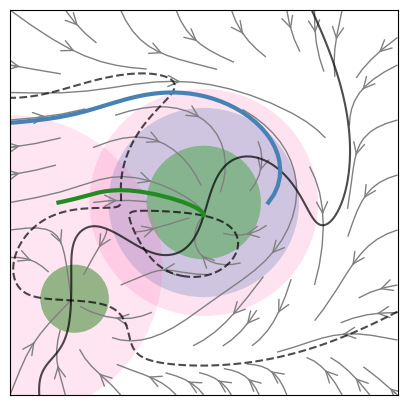

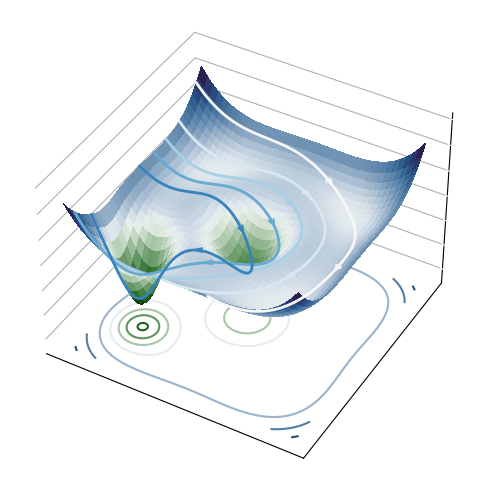

In [227]:
#  Slowing down using a curl module to move the saddle 

# Normal landscape 

L = 6.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

for factor in np.linspace(0., 1., 9):
    
    # print(factor)
    M1 = Node(-4., -3., 6., 0.9)
    M2 = UnstableNode(0., 0., 1., 2.5, tau=1.) 
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)
    M4 = Node(0., 0., 3.3, 1.5, tau=1) 
    M5 = NegCenter(-6., -2., factor*0.5, 4., tau=1)
    

    module_lists = ([M1, M2, M3, M5], [M4,], [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
    
        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.5)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/

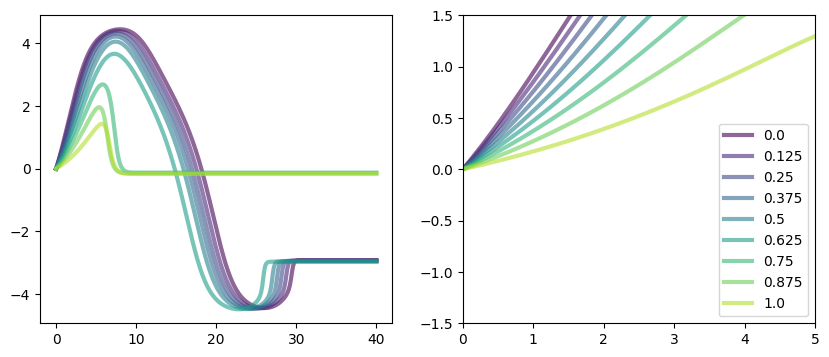

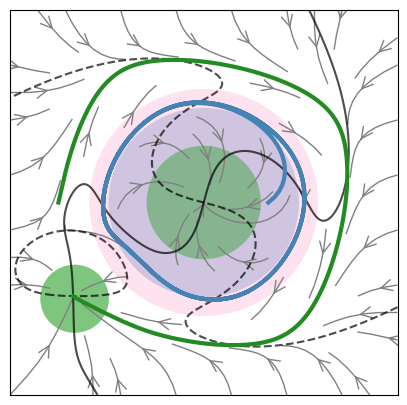

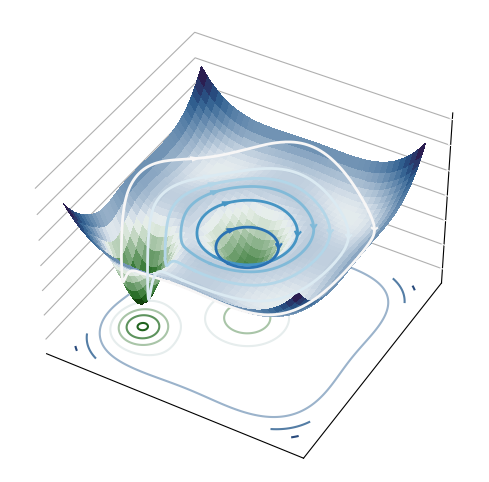

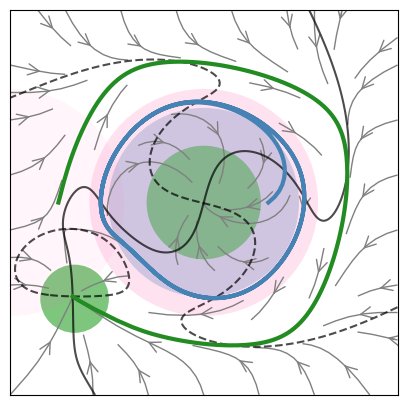

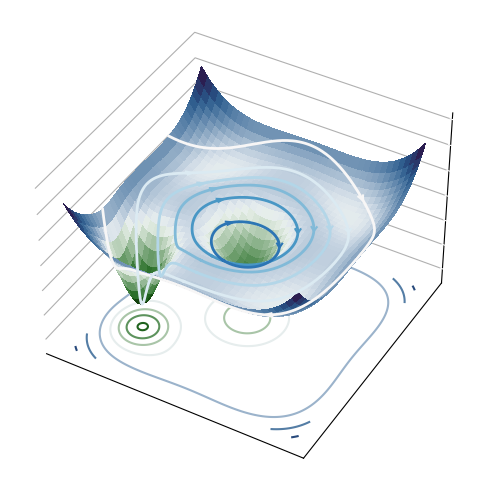

...

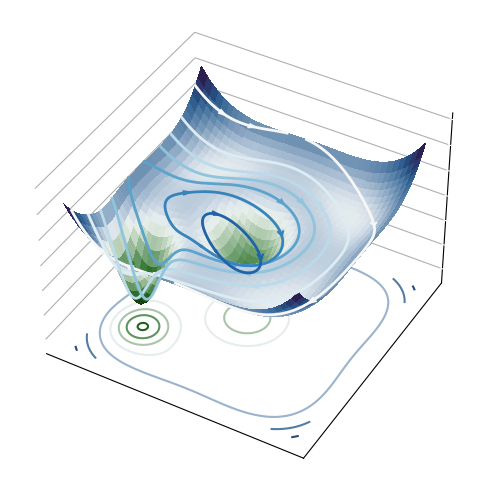

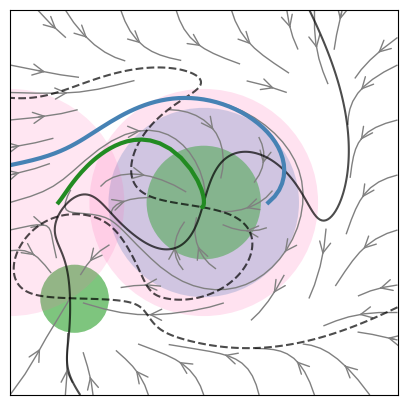

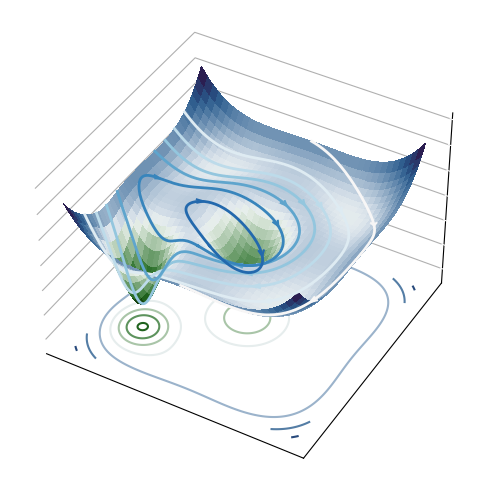

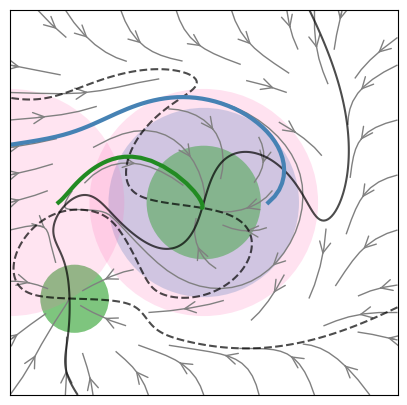

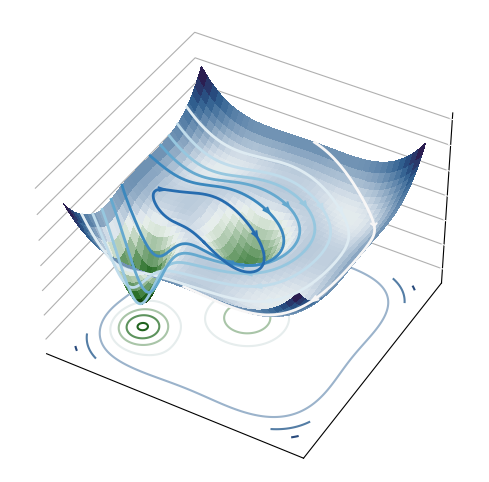

In [224]:
#  Slowing down using a curl module to move the saddle 

# Normal landscape 

L = 6.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

for factor in np.linspace(0., 1., 9):
    
    # print(factor)
    M1 = Node(-4., -3., 6., 0.9)
    M2 = UnstableNode(0., 0., 1., 2.5, tau=1.)  # was 1, 2.5
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)
    M4 = Node(0., 0., 3.3, 1.5, tau=1)  # was 3.3, 1.5
    M5 = NegCenter(-6., 0., factor*0.5, 3., tau=1)
    

    module_lists = ( [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
    
        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.5)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()

/Users/victoria/Code/landscapes/src/evoscape/landscape_visuals.py:133: RuntimeWarning: invalid value encountered in divide
  direction /= np.linalg.norm(direction)
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: overflow encountered in power
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy, axis=0))
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:68: RuntimeWarning: invalid value encountered in multiply
  dy = J[1][0] * x + J[1][1] * y
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:67: RuntimeWarning: invalid value encountered in multiply
  dx = J[0][0] * x + J[0][1] * y
/Users/victoria/Code/landscapes/src/evoscape/landscapes/landscape_class.py:100: RuntimeWarning: invalid value encountered in multiply
  derivs = self.A0 * np.array((-(x-self.x0[0]) ** 3, -(y-self.x0[1]) ** 3)) + (np.sum(w * dx, axis=0), np.sum(w * dy,

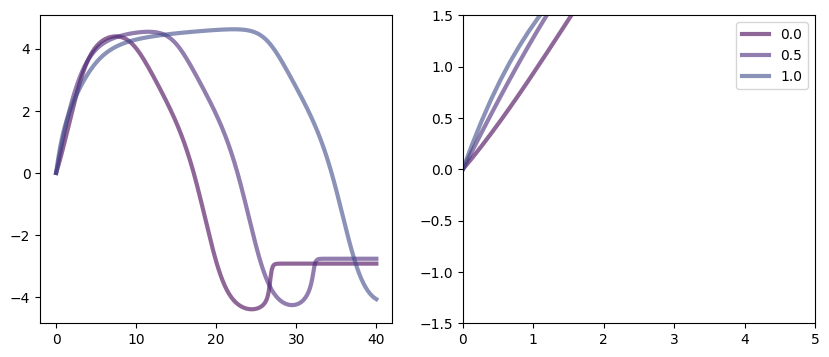

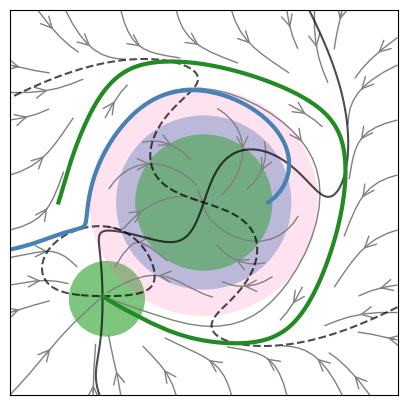

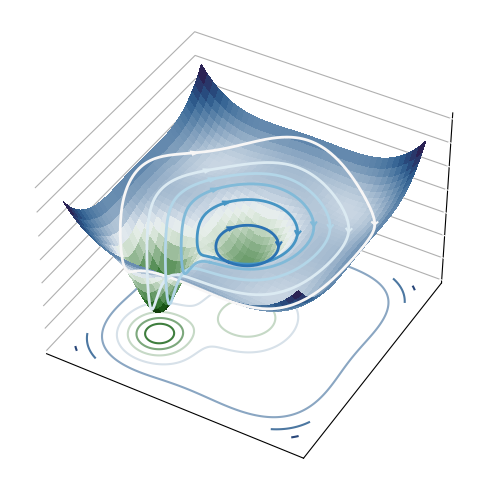

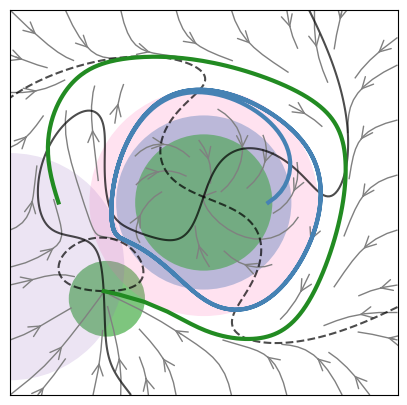

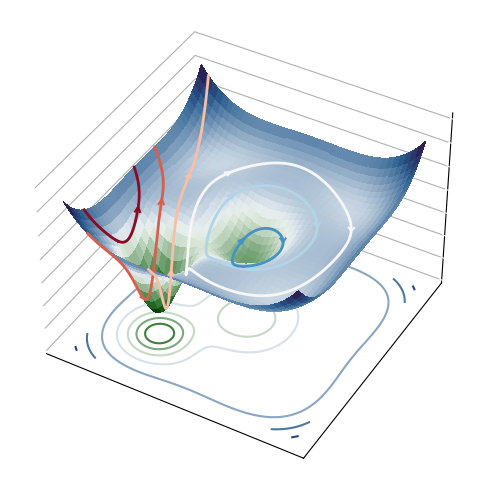

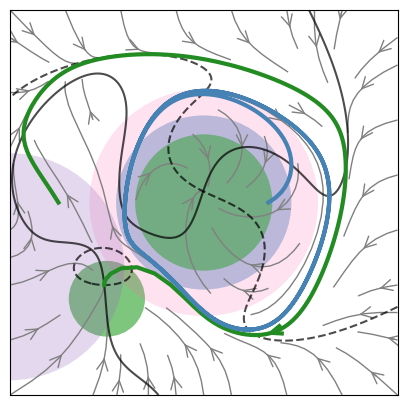

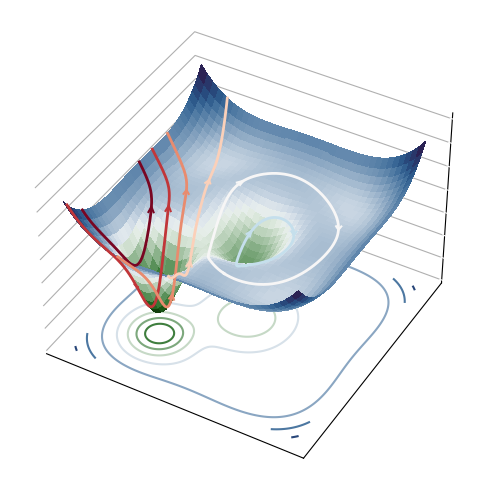

In [206]:
#  Slowing down using a curl module to move the saddle 

# Normal landscape 

L = 6.
npoints = 201
q = np.linspace(-L, L, npoints)
xx, yy = np.meshgrid(q, q, indexing='xy')

fig1, ax1 = plt.subplots(1,2, figsize=(10, 4))
n_lines = 9
viridis_colors = [to_hex(viridis(i / n_lines)) for i in range(n_lines)]
ax1[0].set_prop_cycle(color=viridis_colors)
ax1[1].set_prop_cycle(color=viridis_colors)

for factor in np.linspace(0., 1., 3):
    
    # print(factor)
    M1 = Node(-3., -3., 6., 1.) # acute
    
    M2 = UnstableNode(0., 0., 2.2, 2.3, tau=1.)  # reppeller for the cycle
    M3 = NegCenter(0., 0., 0.6, 3., tau=1.)   # rotation
    M4 = Node(0., 0., 4., 1.8, tau=1)        # chronic
    
    M5 = Center(-6., -2., factor, 3., tau=1)  # growth rate
    

    module_lists = ( [M1, M2, M3, M4, M5],)
    
    
    for module_list in module_lists:
        l = Landscape(module_list, A0 = 0.01, regime=mr_sigmoid, n_regimes=1, morphogen_times=(0.,))
        l_neg = deepcopy(l)
        for m in l_neg.module_list:
            m.a *= -1.
        l_neg.A0 *= -1.

        fig, ax = visualize_landscape_t(l, xx, yy, 0., color_scheme='fp_types', traj_times=(0., 60., 301), traj_init_cond=(-4.5, 0.), traj_start=0)
        l_neg.init_cells(1, (2., 0.))
        traj, states = l_neg.run_cells(0., 50., 301)
        ax.plot(traj[0, 0, :], traj[1, 0, :], lw=3, c='steelblue')
        
        l.init_cells(1, (-4.5, 0.))
        traj, states = l.run_cells(0., 40., 301)
        ax1[0].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
        ax1[1].plot(np.linspace(0., 40., 301), traj[1, 0, :], lw=3, label=factor, alpha=0.6)
    
        # if len(module_list) == 4:
                # ax = plt.gca()
        #     ax.plot(unstable_traj[0, 0, 20:], unstable_traj[1, 0, 20:], lw=3, c='steelblue')
        fig = visualize_potential(l, xx, yy, 0, color_scheme='fp_types', rot_contour=True, elev=40, cmap_center=1.)
        ax1[1].set_xlim((0, 5))
        ax1[1].set_ylim((-1.5,1.5))
        
        ax1[1].legend()